<h1 style="font-size:45px;"> Hypothesis 5</h1>
Marketing channel has a high level of importance for predicting revenue

<h1 style="font-size:45px;"> Hypothesis 6</h1>
Ease of use of the website is important in predicting revenue

<h1 style="font-size:45px;"> Hypothesis 7</h1>
Type of user’s device is important for predicting revenue

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib as mpl
import seaborn as sns

In [2]:
df=pd.read_csv("C:/Users/Lenovo/Desktop/tp/date_index.csv", low_memory=False, index_col="Unnamed: 0", na_values="NA")

In [3]:
df.head()

,date,X1,visits_all,unique_visitors,new_visitors_share,bounce,pageview,session_duration,18-24,25-34,...,finances,household,literature,movies,photography,real_estate,software,telecom,tourism,desktop
1,2017-08-25,1,26,14,100%,7.69230769230769%,4.346154,00:07:39,NaN,40.0,...,30.0,NaN,30.0,30.0,NaN,NaN,NaN,NaN,30.0,40.0
2,2017-08-26,2,15,13,84.6153846153846%,6.66666666666667%,3.333333,00:04:44,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-08-27,3,23,16,75%,8.69565217391304%,7.304348,00:09:19,NaN,NaN,...,NaN,10.0,10.0,10.0,NaN,10.0,NaN,NaN,10.0,NaN
4,2017-08-28,4,45,30,80%,4.44444444444444%,6.222222,00:11:17,NaN,10.0,...,NaN,10.0,10.0,10.0,NaN,10.0,NaN,NaN,10.0,20.0
5,2017-08-29,5,59,42,73.8095238095238%,10.1694915254237%,6.372881,00:13:25,NaN,30.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0


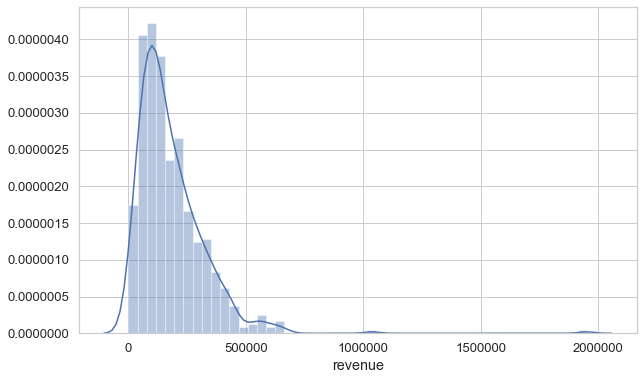

In [4]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.set(style= 'whitegrid', font_scale=1.2)
sns.distplot(df.revenue);

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 995 entries, 1 to 995
Data columns (total 66 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  995 non-null    object 
 1   X1                    995 non-null    int64  
 2   visits_all            995 non-null    int64  
 3   unique_visitors       995 non-null    int64  
 4   new_visitors_share    995 non-null    object 
 5   bounce                995 non-null    object 
 6   pageview              995 non-null    float64
 7   session_duration      995 non-null    object 
 8   18-24                 979 non-null    float64
 9   25-34                 992 non-null    float64
 10  35-44                 978 non-null    float64
 11  45-54                 982 non-null    float64
 12  55                    989 non-null    float64
 13  female                990 non-null    float64
 14  male                  991 non-null    float64
 15  mobile                9

In [6]:
df.describe()

,X1,visits_all,unique_visitors,pageview,18-24,25-34,35-44,45-54,55,female,...,finances,household,literature,movies,photography,real_estate,software,telecom,tourism,desktop
count,995.00000,995.000000,995.000000,995.000000,979.000000,992.000000,978.000000,982.000000,989.000000,990.000000,...,966.000000,990.000000,992.000000,992.000000,962.000000,989.000000,265.000000,983.000000,992.000000,988.000000
mean,498.00000,5070.491457,4097.027136,5.361005,148.437181,608.266129,766.881391,1036.252546,1601.425683,3273.212121,...,920.072464,3168.757576,1421.068548,1231.018145,97.796258,1282.426694,91.283019,1304.323499,1930.806452,2400.921053
std,287.37606,3132.823195,2503.931579,1.382306,107.579375,376.719091,515.486860,627.512288,1052.386381,2084.782600,...,835.696783,2336.408964,949.886534,1038.058749,96.442054,995.916651,128.696315,1119.298917,1298.909406,1374.297743
min,1.00000,15.000000,13.000000,2.725599,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
25%,249.50000,2572.500000,2121.000000,4.199711,70.000000,330.000000,370.000000,490.000000,790.000000,1560.000000,...,92.500000,992.500000,680.000000,410.000000,40.000000,420.000000,20.000000,155.000000,860.000000,1430.000000
50%,498.00000,4475.000000,3616.000000,5.190433,120.000000,525.000000,650.000000,970.000000,1350.000000,2840.000000,...,795.000000,2855.000000,1185.000000,955.000000,70.000000,1090.000000,40.000000,1130.000000,1690.000000,2090.000000
75%,746.50000,6813.000000,5469.500000,6.362735,190.000000,790.000000,1030.000000,1520.000000,2280.000000,4587.500000,...,1350.000000,4570.000000,1945.000000,1765.000000,120.000000,1900.000000,80.000000,2030.000000,2600.000000,3092.500000
max,995.00000,14797.000000,11763.000000,10.430750,650.000000,2180.000000,2740.000000,3000.000000,5550.000000,10570.000000,...,4190.000000,10890.000000,4800.000000,4590.000000,870.000000,4790.000000,610.000000,4530.000000,6540.000000,6600.000000


In [7]:
#dealing with % variables
df['bounce']=df['bounce'].str.rstrip('%').astype('float') / 100.0 #converting the %str to floats
df['new_visitors_share']=df['new_visitors_share'].str.rstrip('%').astype('float') / 100.0 #converting the %str to floats
df['dns_percent']=df['dns_percent'].str.rstrip('%').astype('float') / 100.0

In [8]:
#dealing with session duration 
for i in range(1,len(df['session_duration'])+1):
    h, m, s = df.loc[i,'session_duration'].split(':')
    df.loc[i,'session_duration']=int(h) * 3600 + int(m) * 60 + int(s)
df['session_duration']=df['session_duration'].astype('int')

In [9]:
#dealing with seasons
df['season']=0
for i in range(1,len(df['date'])+1):
    y, m, d = df.loc[i,'date'].split('-')
    if 3<=int(m)<=5:
        df.loc[i,'season']="spring"
    elif 6<=int(m)<=8:
        df.loc[i,'season']="summer"
    elif 9<=int(m)<=11:
        df.loc[i,'season']="fall"
    else:
        df.loc[i,'season']="winter"

In [10]:
df=df.drop(['date',"google", 'mailru', 'yandex', 'facebook', 'X1', 'targetvk', 'targetinst', 'tv', 'software', 'targetmail'], axis=1)

In [11]:
df['season'].value_counts()

fall      273
winter    271
spring    260
summer    191
Name: season, dtype: int64

In [12]:
df.groupby('season')['visits_all',"session_duration", 'revenue', 'transactions'].mean()

C:\Users\Lenovo\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,visits_all,session_duration,revenue,transactions
season,,,,
fall,4013.282051,440.472527,119755.269634,70.000000
spring,5759.523077,283.180769,236443.907166,118.083832
summer,3701.492147,356.732984,167169.043464,75.000000
winter,6439.306273,427.132841,198354.505482,126.906077


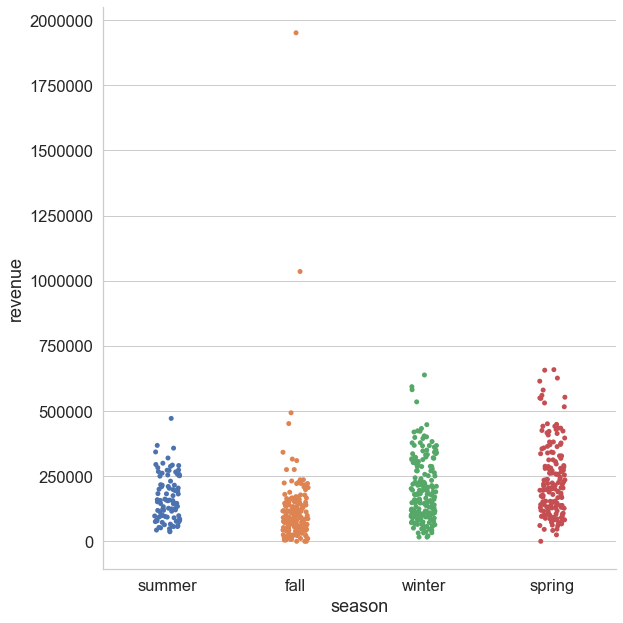

In [14]:
sns.set(style='whitegrid', font_scale=1.5)
sns.catplot(x="season", y='revenue',  data=df, height=9);

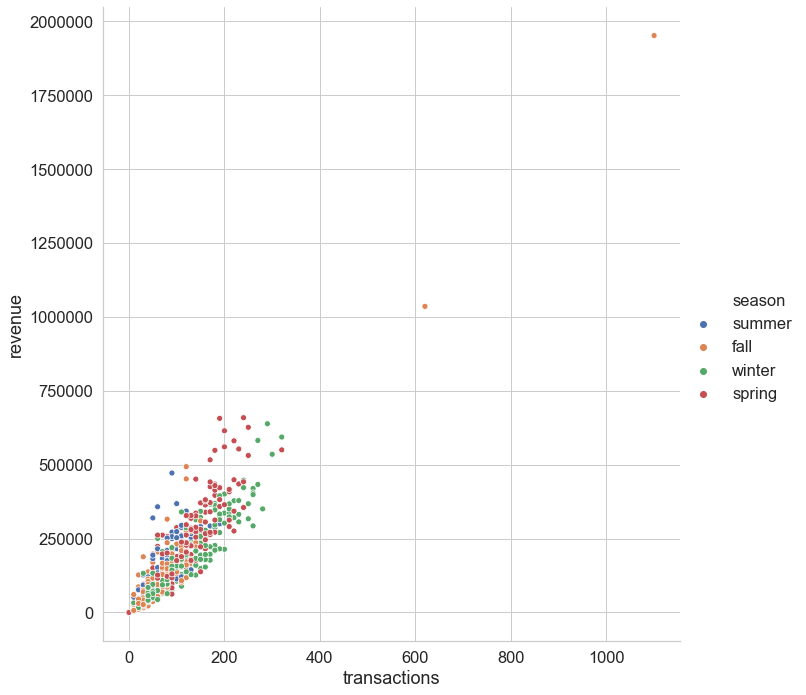

In [15]:
sns.set(style='whitegrid', font_scale=1.5)

g = sns.relplot(x="transactions", y="revenue", hue="season", data=df, height=10)

In [16]:
#those 2 dots look like outliers 
#deleting outliers
df=df.drop(df.index[826], axis=0)
df=df.drop(df.index[455], axis=0)

In [17]:
mis_col=[col for col in df.columns if df[col].isnull().any()]

In [18]:
df['transactions']=df['transactions'].fillna(0)
df['revenue']=df['revenue'].fillna(0)
df['avg_visit_revenue']=df['avg_visit_revenue'].fillna(0)
df['avg_bill']=df['avg_bill'].fillna(0)


In [19]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(strategy='mean') #initiate the imputer with most frequent values
df[mis_col] = imp.fit_transform(df[mis_col]) 

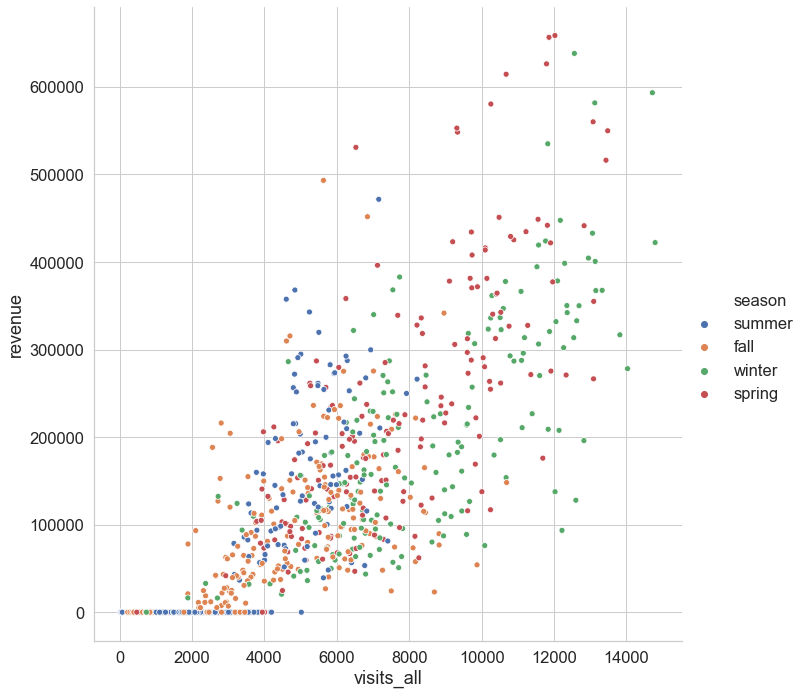

In [20]:
#better looking plot
sns.set(style='whitegrid', font_scale=1.5)
g = sns.relplot(x="visits_all", y="revenue", hue="season", data=df, height=10)

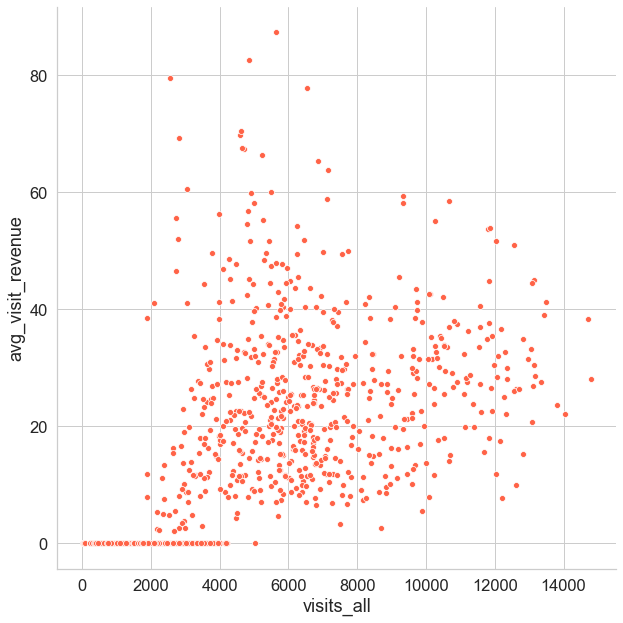

In [21]:
sns.set(style='whitegrid', font_scale=1.5)
sns.relplot(x="visits_all", y="avg_visit_revenue",  data=df, height=9, color='tomato');

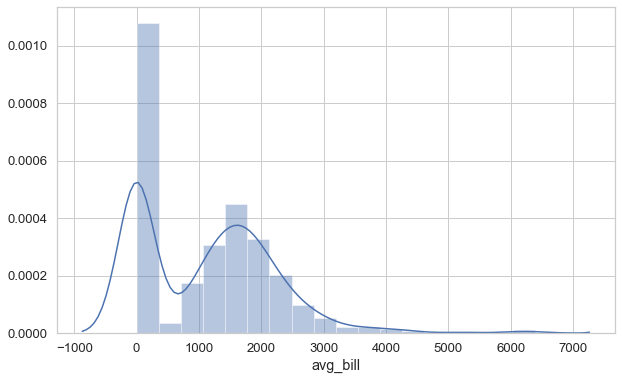

In [22]:
plt.figure(figsize=(10, 6))
sns.set(style= 'whitegrid', font_scale=1.2)
sns.distplot(df.avg_bill); #skewed a bit to the right, but nice looking (log is terrible)

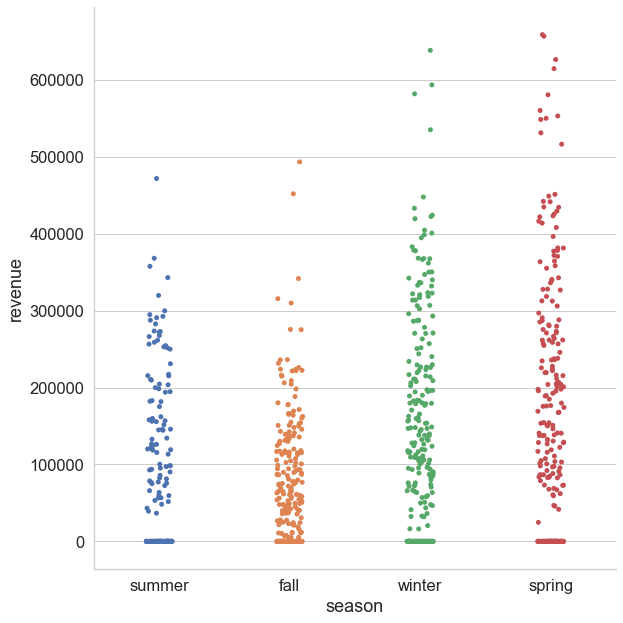

In [23]:
sns.set(style='whitegrid', font_scale=1.5)
sns.catplot(x="season", y='revenue',  data=df, height=9);

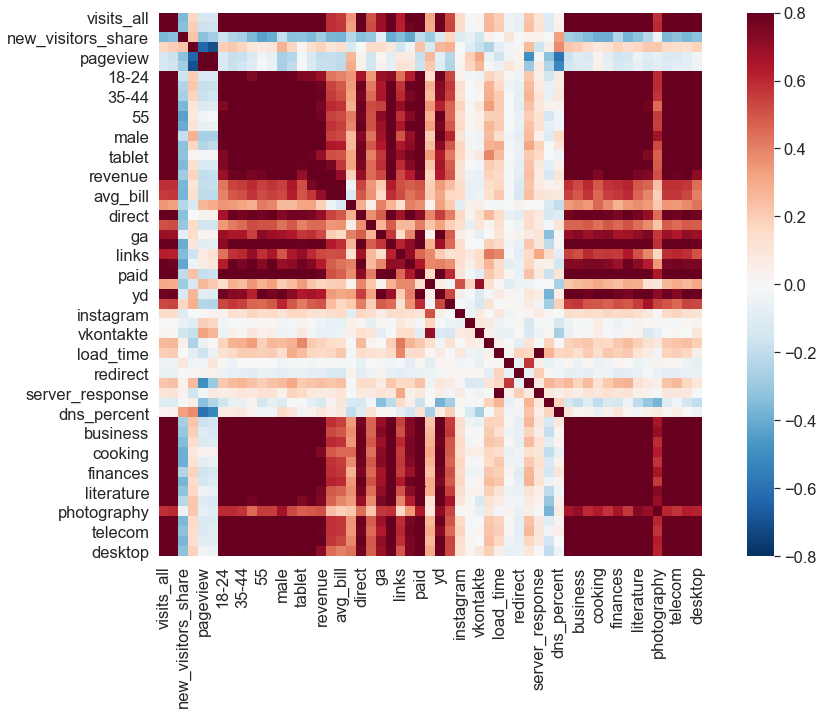

In [24]:
import matplotlib.pyplot as plt
#correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(corrmat,vmin=-.8, vmax=.8, square=True, cmap='RdBu_r')

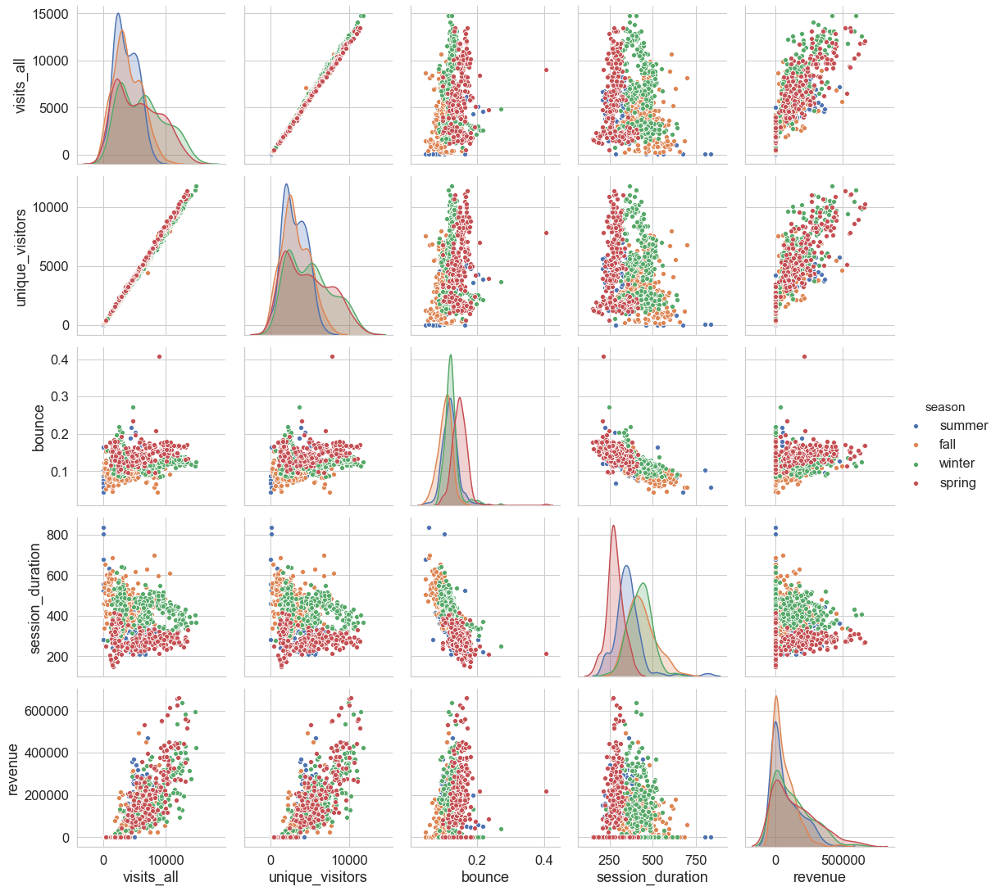

In [25]:
sns.pairplot(df.loc[:,['visits_all', "unique_visitors", "bounce", "session_duration", 'revenue','season']], hue="season", height=3);

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 993 entries, 1 to 995
Data columns (total 56 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   visits_all            993 non-null    int64  
 1   unique_visitors       993 non-null    int64  
 2   new_visitors_share    993 non-null    float64
 3   bounce                993 non-null    float64
 4   pageview              993 non-null    float64
 5   session_duration      993 non-null    int32  
 6   18-24                 993 non-null    float64
 7   25-34                 993 non-null    float64
 8   35-44                 993 non-null    float64
 9   45-54                 993 non-null    float64
 10  55                    993 non-null    float64
 11  female                993 non-null    float64
 12  male                  993 non-null    float64
 13  mobile                993 non-null    float64
 14  tablet                993 non-null    float64
 15  transactions          9

In [28]:
corrmat['revenue'].sort_values(ascending=False)#check features correlated with lnSalePrice

revenue                 1.000000
transactions            0.922656
avg_visit_revenue       0.868755
mobile                  0.829310
beauty                  0.826630
unique_visitors         0.824619
household               0.824076
cars                    0.818006
visits_all              0.817978
finances                0.811277
tourism                 0.807413
internal                0.806448
real_estate             0.805945
female                  0.801654
family                  0.798978
business                0.798756
male                    0.794532
telecom                 0.787150
35-44                   0.781325
paid                    0.780524
25-34                   0.778784
55                      0.773762
45-54                   0.761901
literature              0.759489
cooking                 0.749944
movies                  0.746406
desktop                 0.718520
direct                  0.704966
avg_bill                0.704465
tablet                  0.698050
18-24     

In [29]:
corrval = corrmat.unstack()
corrval[(abs(corrval) > 0.6) & (abs(corrval) < 1)] #check the correlated features

visits_all  unique_visitors    0.997979
            18-24              0.837111
            25-34              0.939142
            35-44              0.933951
            45-54              0.925223
                                 ...   
desktop     movies             0.864096
            photography        0.617684
            real_estate        0.903716
            telecom            0.879406
            tourism            0.931801
Length: 1058, dtype: float64

In [30]:
df_dummy=pd.get_dummies(df)

In [31]:
df_dummy.head()

,visits_all,unique_visitors,new_visitors_share,bounce,pageview,session_duration,18-24,25-34,35-44,45-54,...,movies,photography,real_estate,telecom,tourism,desktop,season_fall,season_spring,season_summer,season_winter
1,26,14,1.000000,0.076923,4.346154,459,147.963153,40.000000,764.918033,1032.938776,...,30.000000,97.770833,1278.449848,1299.317023,30.000000,40.000000,0,0,1,0
2,15,13,0.846154,0.066667,3.333333,284,147.963153,606.505051,764.918033,1032.938776,...,1228.282828,97.770833,1278.449848,1299.317023,1925.393939,2394.442191,0,0,1,0
3,23,16,0.750000,0.086957,7.304348,559,147.963153,606.505051,764.918033,1032.938776,...,10.000000,97.770833,10.000000,1299.317023,10.000000,2394.442191,0,0,1,0
4,45,30,0.800000,0.044444,6.222222,677,147.963153,10.000000,764.918033,1032.938776,...,10.000000,97.770833,10.000000,1299.317023,10.000000,20.000000,0,0,1,0
5,59,42,0.738095,0.101695,6.372881,805,147.963153,30.000000,764.918033,1032.938776,...,1228.282828,97.770833,1278.449848,1299.317023,1925.393939,20.000000,0,0,1,0


In [32]:
df_dummy=df_dummy.drop(['transactions', 'avg_visit_revenue'], axis=1)

In [33]:
y = df_dummy.revenue 
X=df_dummy.drop(['revenue', "avg_bill"], axis=1)

In [34]:
X.head()

,visits_all,unique_visitors,new_visitors_share,bounce,pageview,session_duration,18-24,25-34,35-44,45-54,...,movies,photography,real_estate,telecom,tourism,desktop,season_fall,season_spring,season_summer,season_winter
1,26,14,1.000000,0.076923,4.346154,459,147.963153,40.000000,764.918033,1032.938776,...,30.000000,97.770833,1278.449848,1299.317023,30.000000,40.000000,0,0,1,0
2,15,13,0.846154,0.066667,3.333333,284,147.963153,606.505051,764.918033,1032.938776,...,1228.282828,97.770833,1278.449848,1299.317023,1925.393939,2394.442191,0,0,1,0
3,23,16,0.750000,0.086957,7.304348,559,147.963153,606.505051,764.918033,1032.938776,...,10.000000,97.770833,10.000000,1299.317023,10.000000,2394.442191,0,0,1,0
4,45,30,0.800000,0.044444,6.222222,677,147.963153,10.000000,764.918033,1032.938776,...,10.000000,97.770833,10.000000,1299.317023,10.000000,20.000000,0,0,1,0
5,59,42,0.738095,0.101695,6.372881,805,147.963153,30.000000,764.918033,1032.938776,...,1228.282828,97.770833,1278.449848,1299.317023,1925.393939,20.000000,0,0,1,0


In [35]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.25, random_state = 0)
lr = LinearRegression() #initiate the model with default parameters
lr.fit(train_X,train_y)
lr.predict(test_X)
auc_lr=lr.score(test_X, test_y)
print("Accuracy of linear regression on test set:" , auc_lr)

Accuracy of linear regression on test set: 0.7361540438432149


In [36]:
y = df_dummy.revenue 
X=df_dummy.drop(['revenue', "avg_bill"], axis=1)

In [37]:
X=X.drop(X.iloc[:, 37:49], axis=1)

In [38]:
X=X.drop("tourism", axis=1)

In [39]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 993 entries, 1 to 995
Data columns (total 42 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   visits_all            993 non-null    int64  
 1   unique_visitors       993 non-null    int64  
 2   new_visitors_share    993 non-null    float64
 3   bounce                993 non-null    float64
 4   pageview              993 non-null    float64
 5   session_duration      993 non-null    int32  
 6   18-24                 993 non-null    float64
 7   25-34                 993 non-null    float64
 8   35-44                 993 non-null    float64
 9   45-54                 993 non-null    float64
 10  55                    993 non-null    float64
 11  female                993 non-null    float64
 12  male                  993 non-null    float64
 13  mobile                993 non-null    float64
 14  tablet                993 non-null    float64
 15  criteo                9

In [40]:
#linear regression without interest 
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.25, random_state = 0)
lr = LinearRegression() #initiate the model with default parameters
lr.fit(train_X,train_y)
lr.predict(test_X)
auc_lr=lr.score(test_X, test_y)
print("Accuracy of linear regression on test set (no interest col):" , auc_lr)

Accuracy of linear regression on test set (no interest col): 0.6449872213863439


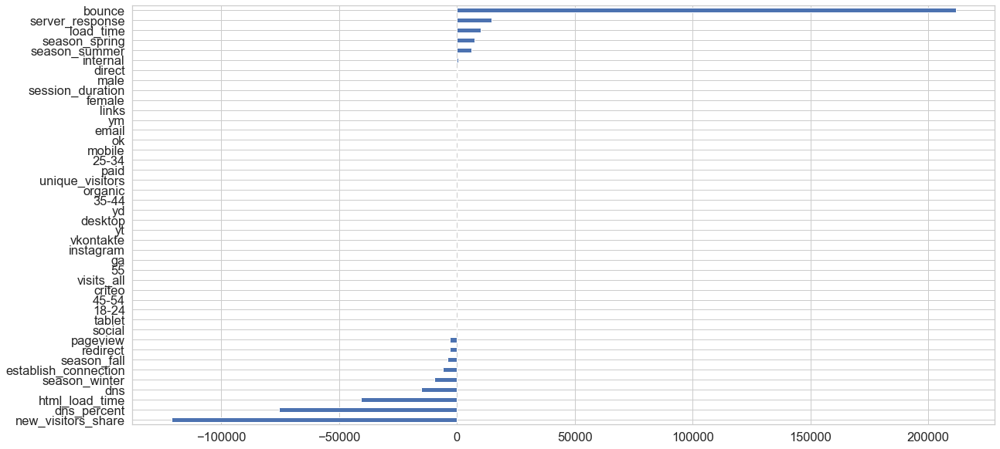

In [41]:
plt.figure(figsize=(20,10))
pd.Series(lr.coef_,index=X.columns).sort_values().plot(kind = "barh");
#horror 

In [42]:
lr.score(X,y) #the coefficient of determination R^2 of the prediction (train set)

0.7237272175222504

In [43]:
import statsmodels.api as sm
from scipy import stats


est = sm.OLS(y, X)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                revenue   R-squared:                       0.748
Model:                            OLS   Adj. R-squared:                  0.737
Method:                 Least Squares   F-statistic:                     68.73
Date:                Sun, 31 May 2020   Prob (F-statistic):          6.78e-253
Time:                        23:23:07   Log-Likelihood:                -12422.
No. Observations:                 993   AIC:                         2.493e+04
Df Residuals:                     951   BIC:                         2.513e+04
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
visits_all             -17.0204 

In [44]:
from sklearn.linear_model import Ridge
r = Ridge(solver='lsqr') #regularized least squares iterative estimator
r.fit(X,y)
r.score(X,y)

0.7388844466911094

In [45]:
from sklearn.linear_model import LassoCV
from sklearn.datasets import make_regression
reg = LassoCV()
reg.fit(X, y)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X,y))
coef = pd.Series(reg.coef_, index = X.columns)

Best alpha using built-in LassoCV: 3102671.747551
Best score using built-in LassoCV: 0.700560


C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3452409356.359375, tolerance: 1477804845.8680236
  tol, rng, random, positive)
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3890671835.432617, tolerance: 1477804845.8680236
  tol, rng, random, positive)
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2846746527.0600586, tolerance: 1477804845.8680236
  tol, rng, random, positive)
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. 

In [48]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 2 variables and eliminated the other 40 variables


Text(0.5, 1.0, 'Feature importance using Lasso Model')

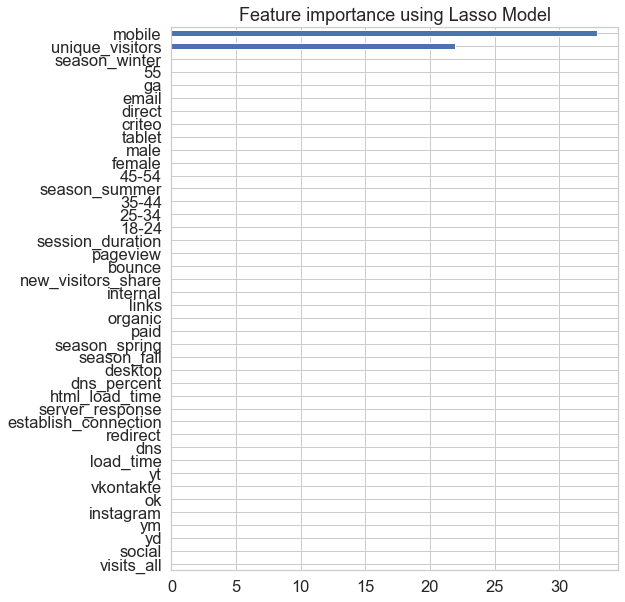

In [49]:
imp_coef = coef.sort_values()
import matplotlib
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh");
plt.title("Feature importance using Lasso Model")

<h1 style="font-size:45px;"> Random forest</h1>


In [50]:
# Labels are the values we want to predict
labels = np.array(df_dummy['revenue'])
# Remove the labels from the features
# axis 1 refers to the columns
features= df_dummy.drop(['revenue', 'avg_bill'], axis = 1)
# Saving feature names for later use
feature_list = list(features.columns)
# Convert to numpy array
features = np.array(features)

In [51]:
# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split
# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25, random_state = 42)

In [52]:
print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)


Training Features Shape: (744, 55)
Training Labels Shape: (744,)
Testing Features Shape: (249, 55)
Testing Labels Shape: (249,)


In [53]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators =150, random_state = 42)
# Train the model on training data
rf.fit(train_features, train_labels);


In [54]:
ausrf=rf.score(test_features, test_labels)
print("Accuracy of random forest model:{:.4f}".format(ausrf))

Accuracy of random forest model:0.7091


In [56]:
# Use the forest's predict method on the test data
predictions = rf.predict(test_features)
# Calculate the absolute errors
errors = abs(predictions - test_labels)
# Print out the mean absolute error (mae)
mae_init=np.mean(errors)
print('Mean Absolute Error:', mae_init, 'degrees.')

Mean Absolute Error: 43274.23860425167 degrees.


In [57]:
from sklearn import metrics
mse_init= metrics.mean_squared_error(test_labels, predictions)
print('Mean Squared Error:',mse_init)
rmse_init=np.sqrt(metrics.mean_squared_error(test_labels, predictions))
print('Root Mean Squared Error:',rmse_init )

Mean Squared Error: 5155063226.378405
Root Mean Squared Error: 71798.76897536896


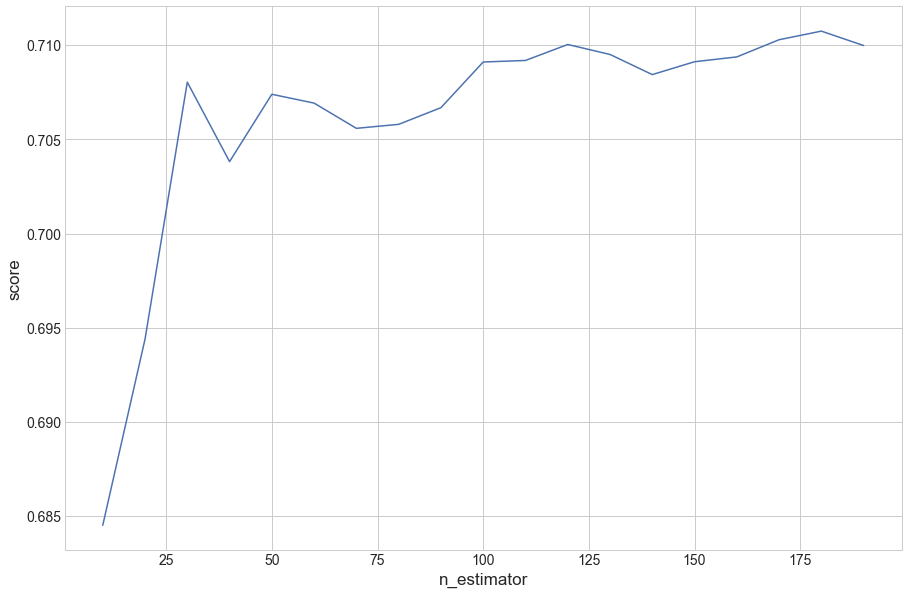

In [58]:
# Try different numbers of n_estimators - this will take a minute or so
estimators = np.arange(10, 200, 10)
scores = []
plt.style.use('seaborn-whitegrid')
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(15,10))
for n in estimators:
    rf.set_params(n_estimators=n)
    rf.fit(train_features, train_labels)
    scores.append(rf.score(test_features, test_labels))
#plt.title("Effect of n_estimators")
plt.xlabel("n_estimator", fontsize=17)
plt.ylabel("score", fontsize=17)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.plot(estimators, scores);

In [72]:
from sklearn.tree import export_graphviz
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'  #Pay attention to modifying your path

estimator = rf.estimators_[5]
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = feature_list,
                rounded = True, proportion = False, 
                precision = 2, filled = True)


In [74]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [75]:
feature_list

['visits_all',
 'unique_visitors',
 'new_visitors_share',
 'bounce',
 'pageview',
 'session_duration',
 '18-24',
 '25-34',
 '35-44',
 '45-54',
 '55',
 'female',
 'male',
 'mobile',
 'tablet',
 'criteo',
 'direct',
 'email',
 'ga',
 'internal',
 'links',
 'organic',
 'paid',
 'social',
 'yd',
 'ym',
 'instagram',
 'ok',
 'vkontakte',
 'yt',
 'load_time',
 'dns',
 'redirect',
 'establish_connection',
 'server_response',
 'html_load_time',
 'dns_percent',
 'beauty',
 'business',
 'cars',
 'cooking',
 'family',
 'finances',
 'household',
 'literature',
 'movies',
 'photography',
 'real_estate',
 'telecom',
 'tourism',
 'desktop',
 'season_fall',
 'season_spring',
 'season_summer',
 'season_winter']

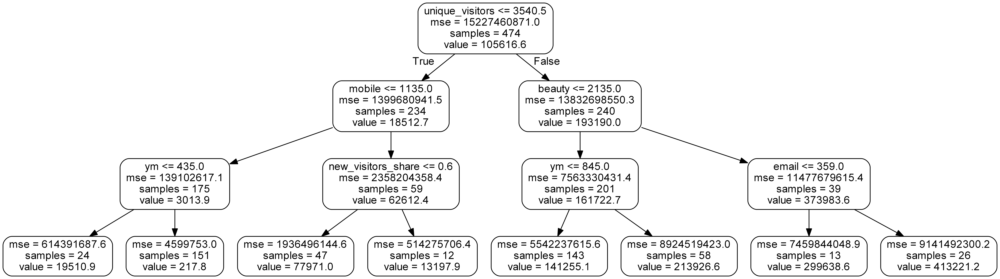

In [79]:
# Limit depth of tree to 3 levels
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(train_features, train_labels)
# Extract the small tree
tree_small = rf_small.estimators_[3]
# Save the tree as a png image
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = feature_list, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')


call(['dot', '-Tpng', 'small_tree.dot', '-o', 'small_tree.png', '-Gdpi=600'])
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'small_tree.png')

In [80]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: unique_visitors      Importance: 0.29
Variable: mobile               Importance: 0.14
Variable: visits_all           Importance: 0.1
Variable: yd                   Importance: 0.1
Variable: beauty               Importance: 0.05
Variable: ym                   Importance: 0.03
Variable: 25-34                Importance: 0.02
Variable: new_visitors_share   Importance: 0.01
Variable: 35-44                Importance: 0.01
Variable: male                 Importance: 0.01
Variable: email                Importance: 0.01
Variable: ga                   Importance: 0.01
Variable: internal             Importance: 0.01
Variable: organic              Importance: 0.01
Variable: paid                 Importance: 0.01
Variable: vkontakte            Importance: 0.01
Variable: yt                   Importance: 0.01
Variable: load_time            Importance: 0.01
Variable: dns                  Importance: 0.01
Variable: redirect             Importance: 0.01
Variable: establish_connection Importance:

In [81]:
rf.feature_importances_

array([9.81429889e-02, 2.92386028e-01, 7.16768044e-03, 3.77593480e-03,
       2.65453948e-03, 2.21256830e-03, 3.17647084e-03, 1.94121934e-02,
       1.07325791e-02, 4.24942925e-03, 4.31027693e-03, 4.39784424e-03,
       1.02632775e-02, 1.36112630e-01, 4.82156980e-03, 3.97210227e-03,
       4.85430752e-03, 1.08757276e-02, 5.05107366e-03, 1.18672269e-02,
       4.27233430e-03, 6.39511126e-03, 8.80856432e-03, 3.74616337e-03,
       9.68949826e-02, 2.55026569e-02, 2.78167577e-03, 1.84851381e-03,
       1.33284691e-02, 8.03821576e-03, 7.64419277e-03, 5.68432673e-03,
       6.78936385e-03, 7.55603628e-03, 4.78779743e-03, 8.33288751e-03,
       4.80301670e-03, 4.95717579e-02, 1.22167228e-02, 9.42190480e-03,
       2.55637698e-03, 7.50839862e-03, 5.86544765e-03, 1.48069058e-02,
       5.71597781e-03, 8.69287404e-03, 2.74108247e-03, 3.19030309e-03,
       2.40748294e-03, 8.23939627e-03, 8.28101472e-03, 3.02529847e-04,
       2.72823080e-04, 4.22655430e-04, 1.35589037e-04])

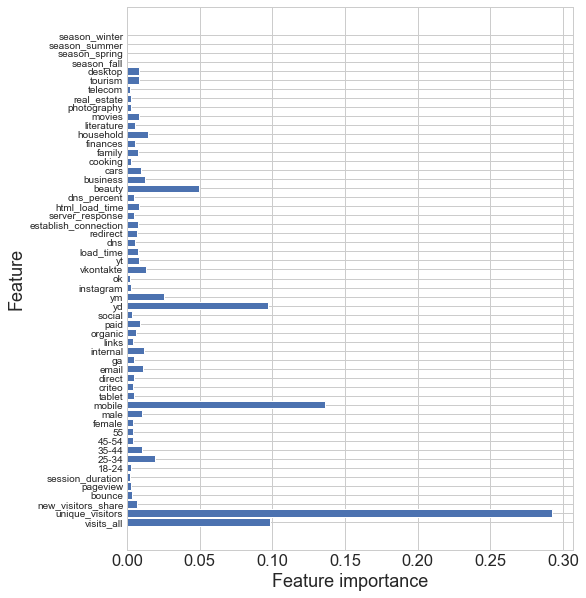

In [82]:
def plot_feature_importances(model):
    n_features = features.shape[1]
    plt.barh(range(n_features), rf.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), feature_list, fontsize=10)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
plot_feature_importances(rf)

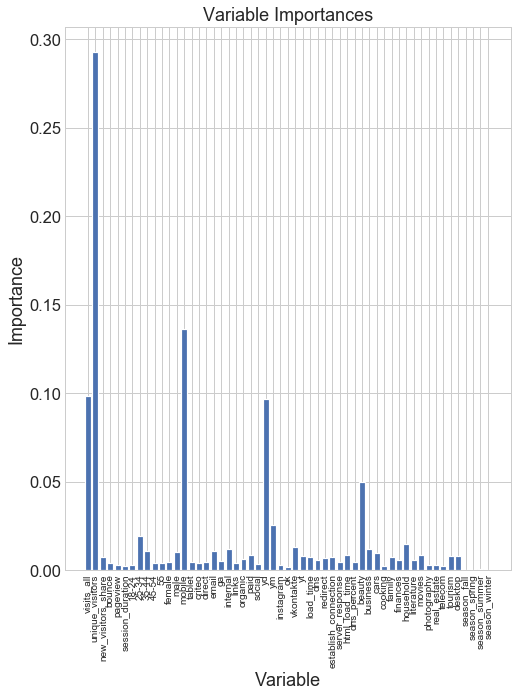

In [83]:
# list of x locations for plotting

x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation='vertical', linewidth = 1.2)
# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical', fontsize=10)
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');


In [84]:
d= { "feature":feature_list, 'importances':importances,}
importances_df=pd.DataFrame(d).sort_values(by='importances', ascending=False)

In [85]:
#plotting first 15 most important features 
plot_imp=importances_df.iloc[:15,:].sort_values(by='importances', ascending=True)

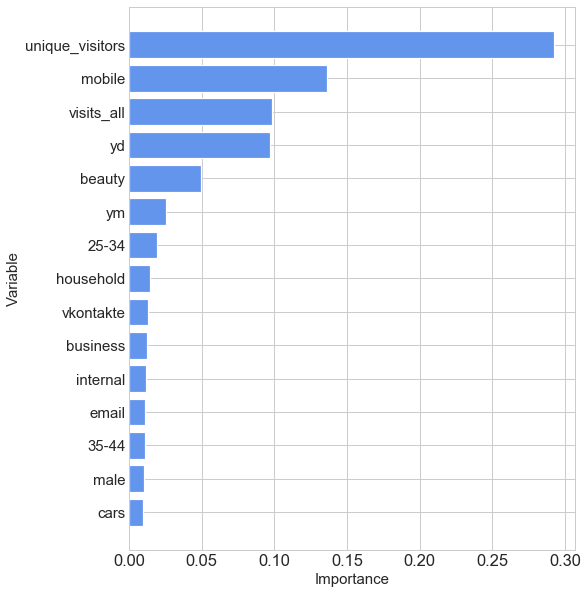

In [86]:
# list of x locations for plotting

plt.style.use('seaborn-whitegrid')

x_values = list(range(len(plot_imp)))
# Make a bar chart
plt.barh( x_values, plot_imp.importances,  linewidth = 1.2, color="cornflowerblue")
# Tick labels for x axis
plt.yticks(x_values, plot_imp.feature, fontsize=15)
# Axis labels and title
plt.xlabel('Importance', fontsize=15); plt.ylabel('Variable', fontsize=15); 




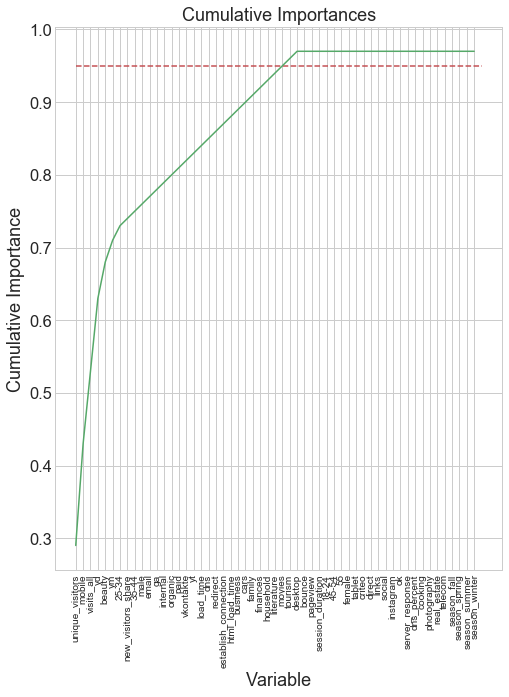

In [87]:
# List of features sorted from most to least important
x_values = list(range(len(importances)))
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]
# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)
# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')
# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')
# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical', fontsize=10)
# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

In [88]:
# Find number of features for cumulative importance of 95%
# Add 1 because Python is zero-indexed
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 29


<h2 style="font-size:30px;"> Most important</h2>


In [89]:
# Extract the names of the most important features
important_feature_names = [feature[0] for feature in feature_importances[0:5]]
# Find the columns of the most important features
important_indices = [feature_list.index(feature) for feature in important_feature_names]
# Create training and testing sets with only the important features
important_train_features = train_features[:, important_indices]
important_test_features = test_features[:, important_indices]
# Sanity check on operations
print('Important train features shape:', important_train_features.shape)
print('Important test features shape:', important_test_features.shape)

Important train features shape: (744, 5)
Important test features shape: (249, 5)


In [90]:
important_feature_names

['unique_visitors', 'mobile', 'visits_all', 'yd', 'beauty']

In [91]:
# Train the expanded model on only the important features

rf.fit(important_train_features, train_labels);
# Make predictions on test data
predictions_1 = rf.predict(important_test_features)

In [92]:
mae_imp= metrics.mean_absolute_error(test_labels, predictions_1)
print('Mean Absolute Error:',mae_imp)
mse_imp=metrics.mean_squared_error(test_labels, predictions_1)
print('Mean Squared Error:', mse_imp)
rmse_imp=np.sqrt(metrics.mean_squared_error(test_labels, predictions_1))
print('Root Mean Squared Error:', rmse_imp)

Mean Absolute Error: 43173.90868604758
Mean Squared Error: 5282111482.502906
Root Mean Squared Error: 72678.13620686007


In [93]:
#final score
auc_imp=rf.score(important_test_features, test_labels)
print("Accuracy of random forest model on important features:{:.4f}".format(auc_imp))

Accuracy of random forest model on important features:0.7020


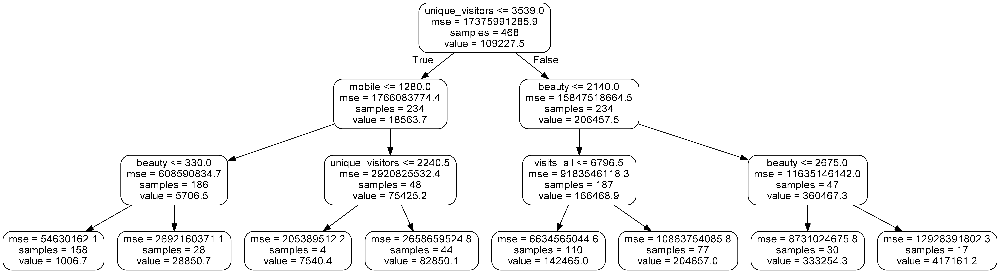

In [102]:
# Limit depth of tree to 3 levels
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(important_train_features, train_labels)
# Extract the small tree
tree_small = rf_small.estimators_[3]
# Save the tree as a png image
export_graphviz(tree_small, out_file = 'small_imp_tree.dot', feature_names = important_feature_names, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_imp_tree.dot')


call(['dot', '-Tpng', 'small_imp_tree.dot', '-o', 'small_imp_tree.png', '-Gdpi=600'])
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'small_imp_tree.png')

In [94]:
res={"RF initial": {"AUC" : ausrf, "MAE": mae_init, "MSE":mse_init, "RMSE":rmse_init }, "RF with most important": {"AUC":auc_imp,"MAE":mae_imp, "MSE":mse_imp, "RMSE":rmse_imp}}  

In [95]:
rf_results=pd.DataFrame(res).style.format("{:.5f}")

In [96]:
rf_results

,RF initial,RF with most important
AUC,0.70912,0.70195
MAE,43274.23860,43173.90869
MSE,5155063226.37840,5282111482.50291
RMSE,71798.76898,72678.13621
